# AIS Data Exploration

Exploration of SPIRE automatic identification system (AIS) data from April and May 2017.

Data consists of a position table containing information about a vessels current location, course, etc, a second static table has meta-data about the vessel such as the vessel IMO, name, length, and width. 

**Static fields**: <br>
['msg_type', 'mmsi', 'timestamp', 'nmea', 'imo', 'name', 'ship_and_cargo_type', 'length', 'width', 'draught', 'eta_date', 'destination', 'call_sign']

**Position data fields**: <br>
['msg_type', 'mmsi', 'timestamp', 'nmea', 'status', 'rot', 'speed', 'accuracy', 'longitude', 'latitude', 'course', 'heading', 'manever', 'geom']

**virtual environment** "ais_data"

*n.b. generation of folium plots may require increasing the data rate limits of jupyter notebooks. This can be adjusted in the jupyter_notebook_config.py file, by adjusting the NotebookApp.iopub_data_rate_limit parameter.*

In [12]:
import pandas as pd
import bokeh
#import datashader as ds

import random

import datashader.transfer_functions as tf
from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9, Hot, viridis, inferno

import folium
from folium import plugins

from datetime import datetime, time
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors

%pylab inline
pylab.rcParams['figure.figsize'] = (15, 5)
plt.rcParams['axes.facecolor']='white'

import warnings
warnings.filterwarnings('ignore')

import ais_query

import imp
imp.reload(ais_query)

Populating the interactive namespace from numpy and matplotlib


<module 'ais_query' from 'ais_query.py'>

In [20]:
cols_position = ais_query.columns_position
cols_static = ais_query.columns_static

# Static AIS

## number of rows

In [4]:
sql_statement = """
SELECT COUNT(*)
FROM ais_messages.full_year_static;
"""
number_of_rows = int(ais_query.connect(sql_statement).iloc[0])
print("number of rows = ", number_of_rows)

number of rows =  4047380


## nulls and unique table

In [9]:
sql_statement = """
SELECT
COUNT(msg_type) AS msg_type,
COUNT(mmsi) AS mmsi,
COUNT(timestamp) AS timestamp,
COUNT(imo) AS imo,
COUNT(name) AS name,
COUNT(ship_and_cargo_type) AS ship_and_cargo_type,
COUNT(length) AS length,
COUNT(width) AS width,
COUNT(draught) AS draught,
COUNT(eta_date) AS eta_date,
COUNT(call_sign) AS call_sign,
COUNT(destination) AS destination
FROM ais_messages.full_year_static; 
"""
summary = ais_query.connect(sql_statement)
summary = summary.append(number_of_rows - summary.loc[0], ignore_index=True)
summary = summary.append((summary.loc[1]/number_of_rows)*100, ignore_index=True).astype(int)

sql_statement = """
SELECT
COUNT(DISTINCT msg_type) AS msg_type,
COUNT(DISTINCT mmsi) AS mmsi,
COUNT(DISTINCT timestamp) AS timestamp,
COUNT(DISTINCT imo) AS imo,
COUNT(DISTINCT name) AS name,
COUNT(DISTINCT ship_and_cargo_type) AS ship_and_cargo_type,
COUNT(DISTINCT length) AS length,
COUNT(DISTINCT width) AS width,
COUNT(DISTINCT draught) AS draught,
COUNT(DISTINCT eta_date) AS eta_date,
COUNT(DISTINCT call_sign) AS call_sign,
COUNT(DISTINCT destination) AS destination
FROM ais_messages.full_year_static; 
"""
distinct = ais_query.connect(sql_statement)
summary = summary.append(distinct, ignore_index=True)

summary = summary.rename(index={0: 'not-null', 1: 'null', 2: 'percentage_null', 3: 'number of unique'})
summary.columns = cols_static

summary

,msg_type,mmsi,timestamp,imo,name,ship_and_cargo_type,length,width,draught,eta_date,call_sign,destination
not-null,4047380,4047380,4047380,2521406,3621835,2876310,2875857,2875857,2521406,2219741,2254259,2486595
null,0,0,0,1525974,425545,1171070,1171523,1171523,1525974,1827639,1793121,1560785
percentage_null,0,0,0,37,10,28,28,28,37,45,44,38
number of unique,2,130326,3295185,71587,120226,256,1023,127,256,61331,102503,108754


# Position AIS

## number of rows

In [10]:
sql_statement = """
SELECT COUNT(*)
FROM ais_messages.full_year_position;
"""
number_of_rows = int(ais_query.connect(sql_statement).iloc[0])
print("number of rows = ", number_of_rows)

number of rows =  136647948


## nulls and unique table

In [21]:
sql_statement = """
SELECT
COUNT(msg_type) AS msg_type,
COUNT(mmsi) AS mmsi,
COUNT(timestamp) AS timestamp,
COUNT(status) AS status,
COUNT(rot) AS rot,
COUNT(speed) AS speed,
COUNT(accuracy) AS accuracy,
COUNT(longitude) AS longitude,
COUNT(latitude) AS latitude,
COUNT(course) AS course,
COUNT(heading) AS heading,
COUNT(maneuver) AS meneuver,
COUNT(geom) AS geom
FROM ais_messages.full_year_position;
"""
summary = ais_query.connect(sql_statement)
summary = summary.append(number_of_rows - summary.loc[0], ignore_index=True)
summary = summary.append((summary.loc[1]/number_of_rows)*100, ignore_index=True).astype(int)

sql_statement = """
SELECT
COUNT(DISTINCT msg_type) AS msg_type,
COUNT(DISTINCT mmsi) AS mmsi,
COUNT(DISTINCT timestamp) AS timestamp,
COUNT(DISTINCT status) AS status,
COUNT(DISTINCT rot) AS rot,
COUNT(DISTINCT speed) AS speed,
COUNT(DISTINCT accuracy) AS accuracy,
COUNT(DISTINCT longitude) AS longitude,
COUNT(DISTINCT latitude) AS latitude,
COUNT(DISTINCT course) AS course,
COUNT(DISTINCT heading) AS heading,
COUNT(DISTINCT maneuver) AS meneuver,
COUNT(DISTINCT geom) AS geom
FROM ais_messages.full_year_position;
"""
distinct = ais_query.connect(sql_statement)
summary = summary.append(distinct, ignore_index=True)

summary = summary.rename(index={0: 'not-null', 1: 'null', 2: 'percentage_null', 3: 'number of unique'})
summary.columns = cols_position
summary

,msg_type,mmsi,timestamp,status,rot,speed,accuracy,longitude,latitude,course,heading,maneuver,geom
not-null,136647948,136647948,136647948,133416505,129796250,134563943,136612294,134563943,134563943,134563943,132992039,133416505,134563943
null,0,0,0,3231443,6851698,2084005,35654,2084005,2084005,2084005,3655909,3231443,2084005
percentage_null,0,0,0,2,5,1,0,1,1,1,2,2,1
number of unique,5,583228,24748562,16,123,1024,2,72004196,43491724,4198,512,4,121686416


In [27]:
sql_statement = """
SELECT count(mmsi)
FROM ais_messages.full_year_position
"""
number_of_mmsi = int(ais_query.connect(sql_statement).iloc[0])

sql_statement = """
SELECT count(mmsi)
FROM ais_messages.full_year_position
WHERE mmsi < 100000000;
"""
number_of_mmsi_less_than = int(ais_query.connect(sql_statement).iloc[0])

0

In [34]:
number_of_mmsi

136647948

# MMSI intersection Position and Static

In [22]:
sql_statement = """
SELECT COUNT(*) FROM
(
SELECT DISTINCT(mmsi) FROM ais_messages.full_year_static
INTERSECT
SELECT DISTINCT(mmsi) FROM ais_messages.full_year_position
) I
"""
number_of_intersections = int(ais_query.connect(sql_statement).iloc[0])
print("intersection of unique MMSI = ", number_of_intersections)

intersection of unique MMSI =  74653


# Map Global AIS Positions 

In [23]:
sql_statement = """
SELECT mmsi, longitude, latitude, timestamp
FROM ais_messages.full_year_position;
"""
ais_position_all = ais_query.connect(sql_statement)
ais_position_all.columns = ['mmsi','longitude', 'latitude', 'timestamp']

### AIS all vessels

In [34]:
ais_position_all.head()

,mmsi,longitude,latitude,timestamp
0,412447777,181.000000,91.000000,2016-08-21 19:32:11
1,657720000,3.216605,6.306012,2016-08-13 01:20:28
2,701000596,-57.540098,-38.046208,2016-08-20 08:35:11
3,538004931,-6.035173,-31.197540,2016-08-24 23:07:02
4,538005878,-77.113283,14.464450,2016-08-06 06:45:35


/home/wgrimes/.conda/envs/ais_data/lib/python3.5/site-packages/datashader/transfer_functions.py:162: DeprecationWarning: `interpolate` is deprecated; use `shade` instead
  warnings.warn(w)


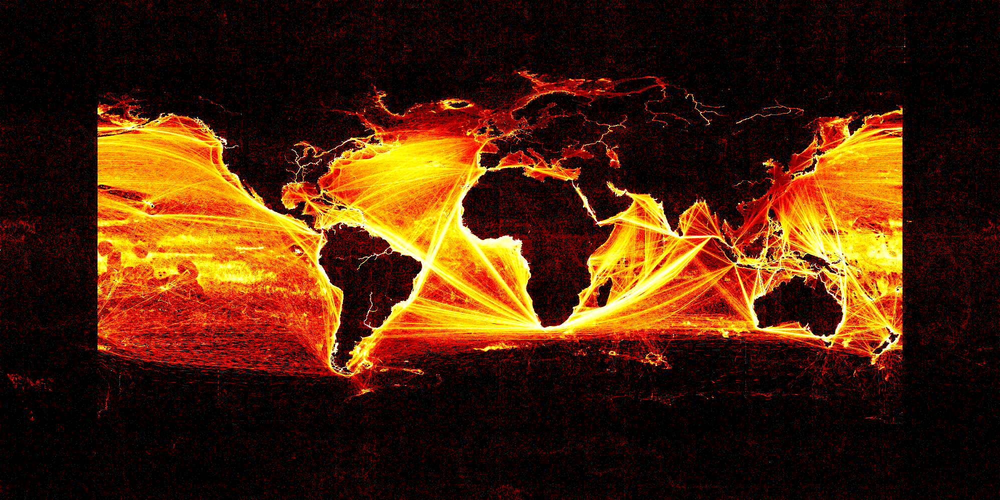

In [54]:
background = "black"
export = partial(export_image, background = background)
cm = partial(colormap_select, reverse=(background!="black"))

cvs = ds.Canvas(plot_width=2000, plot_height=1000)
agg = cvs.points(ais_position_all, 'longitude', 'latitude')
#export(tf.interpolate(agg, cmap = cm(viridis), how='eq_hist'),"vessels")
export(tf.interpolate(agg, cmap = cm(Hot,0.1), how='eq_hist'),"vessels")

### AIS fishing vessels

In [56]:
sql_statement = """
SELECT timestamp, mmsi, ship_and_cargo_type
FROM ais_messages.full_year_static;
"""
ais_static_all = ais_query.connect(sql_statement)
ais_static_all.columns = ['timestamp','mmsi','ship_and_cargo_type']

In [57]:
fishing_mmsi = ais_static_all[ais_static_all.ship_and_cargo_type == 30].mmsi.unique()

In [58]:
fishing_positional = ais_position_all[ais_position_all.mmsi.isin(fishing_mmsi)]

/home/wgrimes/.conda/envs/ais_data/lib/python3.5/site-packages/datashader/transfer_functions.py:162: DeprecationWarning: `interpolate` is deprecated; use `shade` instead
  warnings.warn(w)


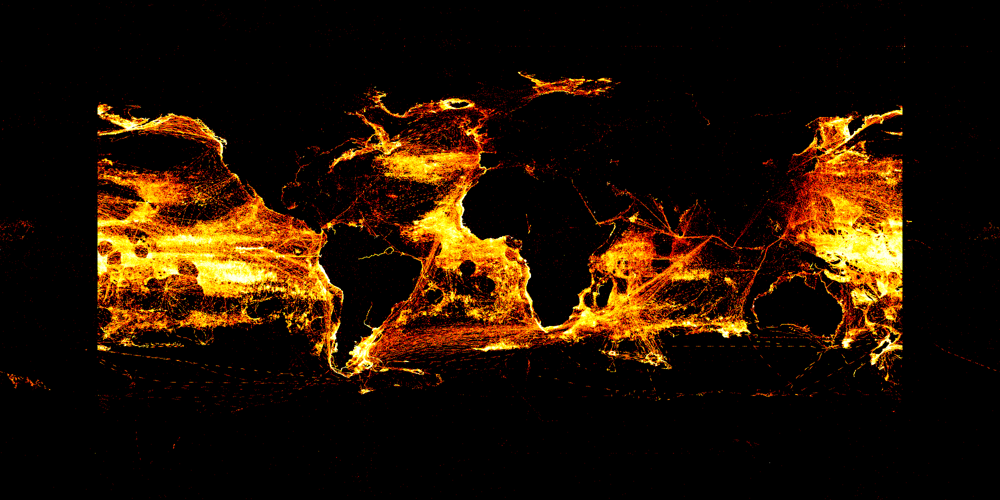

In [59]:
background = "black"
export = partial(export_image, background = background)
cm = partial(colormap_select, reverse=(background!="black"))

cvs = ds.Canvas(plot_width=2000, plot_height=1000)
agg = cvs.points(fishing_positional, 'longitude', 'latitude')
export(tf.interpolate(agg, cmap = cm(Hot, 0.2), how='eq_hist'),"vessels")

# Map Torres Strait AIS Position

## AIS all vessels

In [60]:
sql_statement = """
SELECT mmsi, longitude, latitude
FROM ais_messages.full_year_position
WHERE ((longitude BETWEEN 139 AND 145)
AND (latitude BETWEEN -12 AND -9));
"""
ais_position_torres = ais_query.connect(sql_statement)
ais_position_torres.columns = ['mmsi', 'longitude', 'latitude']

In [61]:
basemap = folium.Map(location=(-10, 142), tiles='Mapbox Bright', zoom_start=7)
heatmap = plugins.HeatMap(
    zip(ais_position_torres['latitude'], ais_position_torres['longitude']),
    gradient={0.3: 'yellow', 0.8: 'orange', 1: 'red'},
    min_opacity=0.6,
    radius=10
)
heatmap = basemap.add_children(heatmap)
heatmap

## AIS fishing vessels

In [62]:
sql_statement = """
SELECT *
FROM ais_messages.full_year_static;
"""
ais_static = ais_query.connect(sql_statement)
ais_static.columns = cols_static

In [63]:
ais_position_torres_mmsi_unique = ais_position_torres['mmsi'].unique()

In [64]:
ais_static_torres = ais_static[ais_static['mmsi'].isin(ais_position_torres_mmsi_unique)]

In [65]:
fishing_torres_mmsi = ais_static_torres[ais_static_torres.ship_and_cargo_type == 30].mmsi.unique()

In [66]:
fishing_position_torres = ais_position_all[ais_position_all['mmsi'].isin(fishing_torres_mmsi)]

In [ ]:
Accent = plt.get_cmap('Accent')

basemap = folium.Map(location=(-10, 142), tiles='Mapbox Bright', zoom_start=7)

for mmsi in fishing_torres_mmsi:
    random_number = random.random()
    a = fishing_position_torres[fishing_position_torres.mmsi == mmsi]
    
    for index, row in a.iterrows():
        size = 3000
        folium.CircleMarker(
            location=list((row.latitude, row.longitude)),
            radius=size,
            popup=str('MMSI: ' + str(row.mmsi) + ' ----------- Timestamp: ' + str(row.timestamp)),
            color='#00ffffff',
            fill_color=matplotlib.colors.rgb2hex(Accent(random_number))
        ).add_to(basemap)


basemap

## Time Frequency AIS pings

In [76]:
ais_position_all['timestamp'] = ais_position_all['timestamp'].apply(str)
ais_position_all['timestamp'] = ais_position_all['timestamp'].apply(lambda x: datetime.datetime.strptime(x,"%Y-%m-%d %H:%M:%S"))

In [78]:
ais_static_all['timestamp'] = ais_static_all['timestamp'].apply(str)
ais_static_all['timestamp'] = ais_static_all['timestamp'].apply(lambda x: datetime.datetime.strptime(x,"%Y-%m-%d %H:%M:%S"))

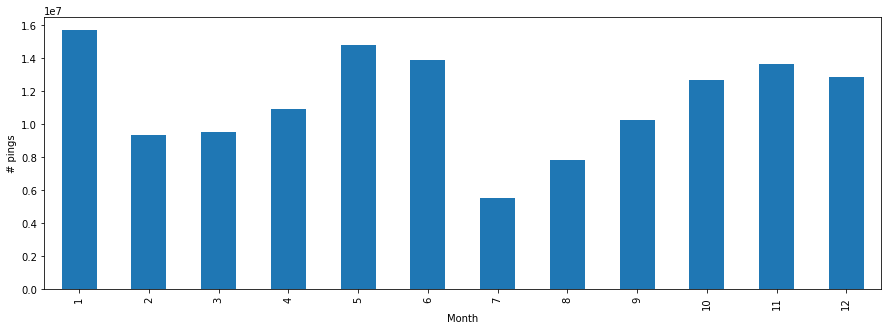

In [79]:
ais_position_all.groupby(ais_position_all.timestamp.dt.month)['timestamp'].count().plot(kind="bar")
plt.xlabel('Month')
plt.ylabel('# pings')

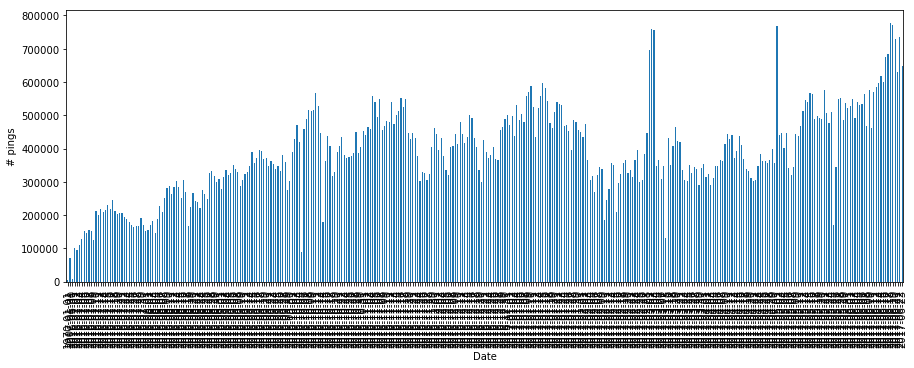

In [80]:
ais_position_all.groupby(ais_position_all.timestamp.dt.date)['timestamp'].count().plot(kind="bar")
plt.xlabel('Date')
plt.ylabel('# pings')

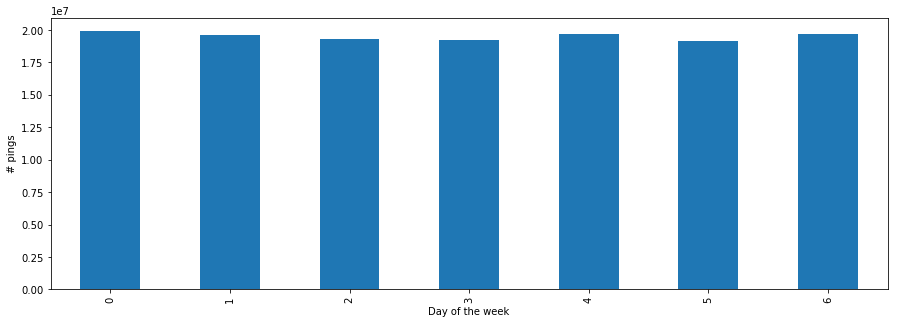

In [81]:
ais_position_all.groupby(ais_position_all.timestamp.dt.weekday)['timestamp'].count().plot(kind="bar")
plt.xlabel('Day of the week')
plt.ylabel('# pings')

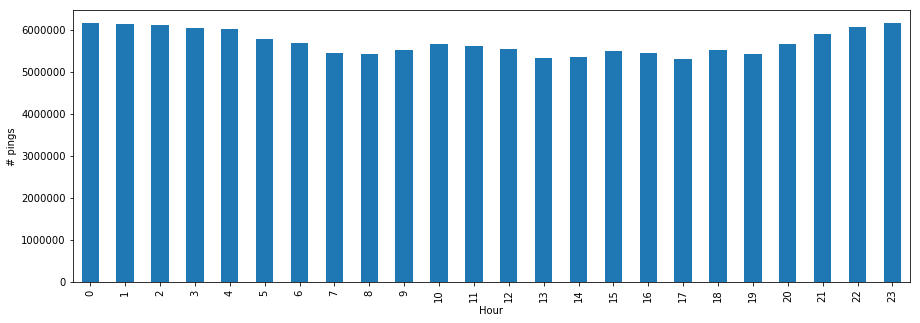

In [82]:
ais_position_all.groupby(ais_position_all.timestamp.dt.hour)['timestamp'].count().plot(kind="bar")
plt.xlabel('Hour')
plt.ylabel('# pings')

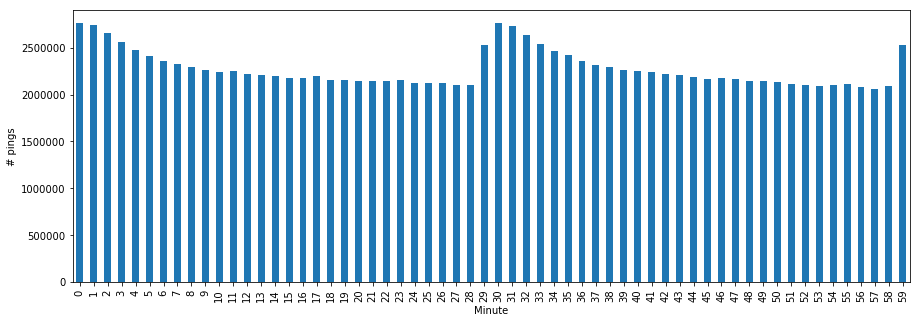

In [83]:
ais_position_all.groupby(ais_position_all.timestamp.dt.minute)['timestamp'].count().plot(kind="bar")
plt.xlabel('Minute')
plt.ylabel('# pings')

## Fishing Time Frequency AIS pings

In [87]:
fishing_positional['timestamp'] = fishing_positional['timestamp'].apply(str)
fishing_positional['timestamp'] = fishing_positional['timestamp'].apply(lambda x: datetime.datetime.strptime(x,"%Y-%m-%d %H:%M:%S"))

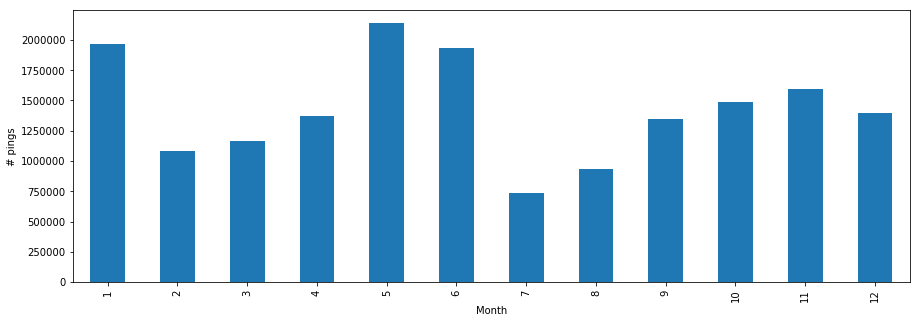

In [88]:
fishing_positional.groupby(fishing_positional.timestamp.dt.month)['timestamp'].count().plot(kind="bar")
plt.xlabel('Month')
plt.ylabel('# pings')

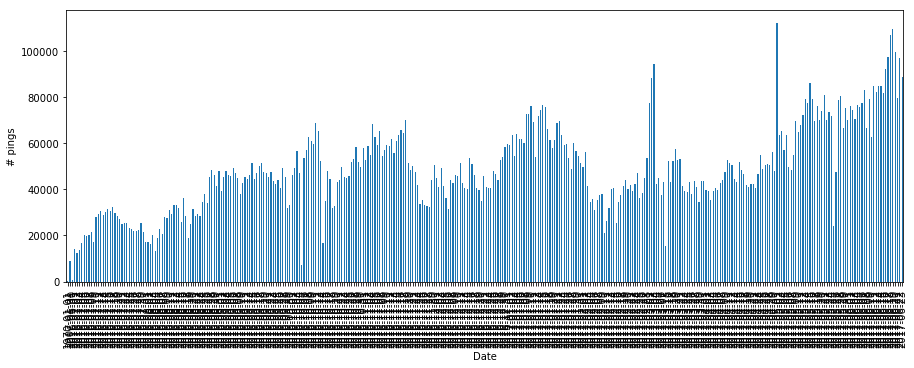

In [93]:
fishing_positional.groupby(fishing_positional.timestamp.dt.date)['timestamp'].count().plot(kind="bar")
plt.xlabel('Date')
plt.ylabel('# pings')

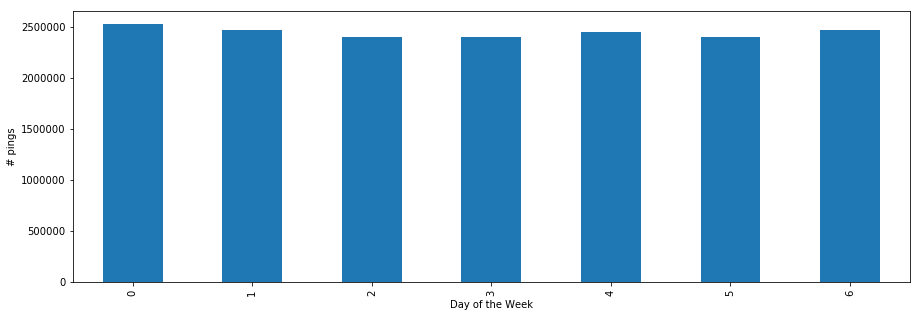

In [94]:
fishing_positional.groupby(fishing_positional.timestamp.dt.weekday)['timestamp'].count().plot(kind="bar")
plt.xlabel('Day of the Week')
plt.ylabel('# pings')

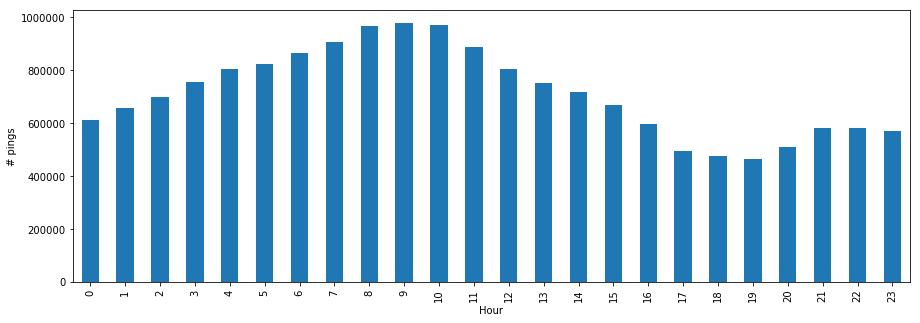

In [95]:
fishing_positional.groupby(fishing_positional.timestamp.dt.hour)['timestamp'].count().plot(kind="bar")
plt.xlabel('Hour')
plt.ylabel('# pings')

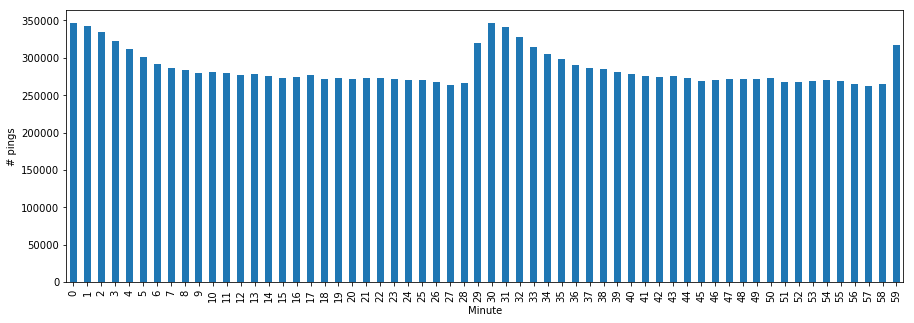

In [92]:
fishing_positional.groupby(ais_position_all.timestamp.dt.minute)['timestamp'].count().plot(kind="bar")
plt.xlabel('Minute')
plt.ylabel('# pings')

# Aggregate AIS

## mmsi average speed

In [84]:
sql_statement = '''
                SELECT mmsi, AVG(speed) AS AverageSpeed
                FROM ais_messages.full_year_position
                GROUP BY mmsi; 
                '''
average_speed = ais_query.connect(sql_statement)
#plt.hist(average_speed.ix[:,1])#, range=[1,60], bins=60) #histogram trip intervals days

## mmsi trip interval seconds

In [85]:
sql_statement = '''
                SELECT mmsi, EXTRACT(EPOCH FROM (MAX(timestamp) - MIN(timestamp))) AS interval,
                COUNT(mmsi) AS number_timestamps,
                EXTRACT(EPOCH FROM (MAX(timestamp) - MIN(timestamp)))/COUNT(mmsi) AS average_diff
                --timestamp - average_diff
                FROM ais_messages.full_year_position
                GROUP BY mmsi; 
                '''
trip_interval_seconds = ais_query.connect(sql_statement)
#plt.hist(trip_interval_seconds.ix[:,1]/86400, range=[1,60], bins=60) #histogram trip intervals days

## mmsi stdev ais time

In [86]:
sql_statement = '''SELECT 
                       t.mmsi,
                       STDDEV(t.time_diff) AS std
                   FROM
                   (
                       SELECT
                           mmsi,
                           EXTRACT(EPOCH FROM (timestamp - LAG(timestamp) OVER
                                   (PARTITION BY mmsi ORDER BY timestamp))) AS time_diff 
                       FROM ais_messages.full_year_position
                       ORDER BY mmsi, timestamp
                   ) t
                   WHERE t.time_diff IS NOT NULL
                   GROUP BY t.mmsi
                   '''

stddev_timestamp = ais_query.connect(sql_statement)